# Dogs & Cats Classifier


### **NOTE**: Please select a GPU instance before running this notebook to save time on training the CNN model.

# Roadmap



*   Step 1: Get input images (training/testing) ✅
  - 8000 Training Images (4000 each)
  - 2000 Test Images (1000 each)
*   Step 2: Transform and pre-process images ✅
*   Step 3: Model Training ✅
*   Step 4: Model Validation ✅
*   Step 5: Evaluation on Test Set ✅
*   Step 6: Comparison with other models 

  - SVM ✅

  - Random Forest ✅

  - KNN ✅



---


Comments - 1st Check-In
*   Track runtime
    - In which step? Prediction / Training / other?
*   Feature engineering scikit-learn models

Comments - 2nd Check-In

*   SVM
  - Feature space for images

  ROC
  Error Analysis - ResNet


# Instructions to select a GPU instance

Before runnning this notebook, please select a GPU runtime by following these steps - 
1.   Click on the 'Runtime' tab
2.   Click on 'Change Runtime Type'
3.   From the Hardware Accelerator Dropdown select 'GPU'
4.   Click 'Save' to confirm your changes


# Instructions for Kaggle Setup
Please follow these instructions to obtain a `kaggle.json` file which is required to run this notebook.

1.   Log in to Kaggle using your preferred account
2.   Click on your profile avatar on the top-right corner of the page.
3.   Click the 'Account' button.
4.   From the API section, click on 'Create New API Token'
5.   This will download the `kaggle.json` file to your local system.
6.   Upload the file to this colab notebook by using the file browser.



## Downloading the dataset from Kaggle using the Kaggle API

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

!cd /content/drive/MyDrive/CSC-869TermProject

Mounted at /content/drive
/bin/bash: line 0: cd: /content/drive/MyDrive/CSC-869TermProject: No such file or directory


In [ ]:
%%capture
!pip install kaggle

To download the kaggle.json API file, follow these steps -
1. Go to your kaggle account, Scroll to API section and Click Expire API Token to remove previous tokens
2. Click on Create New API Token - It will download kaggle.json file on your machine.
3. Upload the JSON file to the root of the Colab directory

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d chetankv/dogs-cats-images

100% 435M/435M [00:25<00:00, 19.8MB/s]
100% 435M/435M [00:25<00:00, 18.0MB/s]


In [ ]:
#!rm -rf dataset
#!rm -rf "dog vs cat"

In [ ]:
%%capture
!unzip dogs-cats-images.zip

# Initial Analysis

### Size of Training & Test Data


In [ ]:
import os
os.listdir('dog vs cat/dataset')

['training_set', 'test_set']

In [ ]:
# Training Data
training_path = 'dog vs cat/dataset/training_set'
for class_name in os.listdir(training_path):
  print(f'Number of Training Samples for {class_name} = {len(os.listdir(training_path + "/" + class_name))}')

Number of Training Samples for cats = 4000
Number of Training Samples for dogs = 4000


In [ ]:
# Test Data
test_path = 'dog vs cat/dataset/test_set'
for class_name in os.listdir(test_path):
  print(f'Number of Testing Samples for {class_name} = {len(os.listdir(test_path + "/" + class_name))}')

Number of Testing Samples for cats = 1000
Number of Testing Samples for dogs = 1000


### Displaying a few images

In [ ]:
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

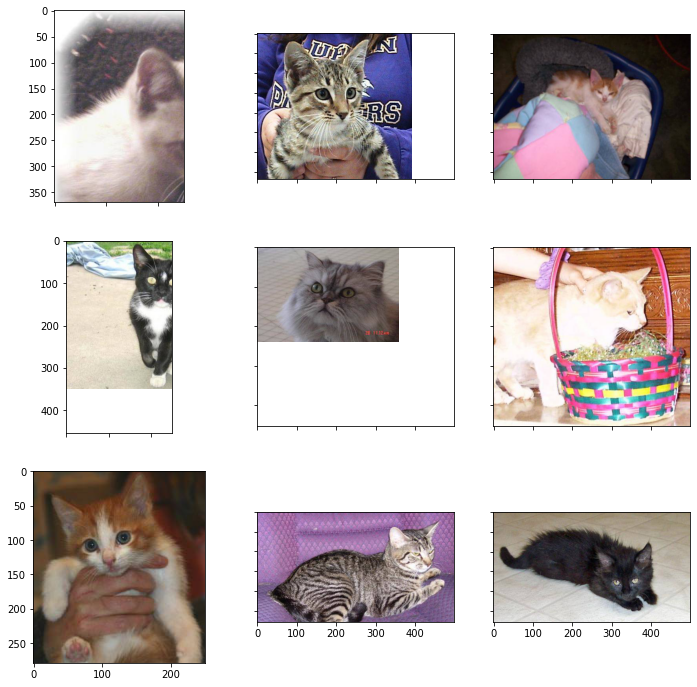

In [ ]:
cat_image_paths = 'dog vs cat/dataset/training_set/cats'
cat_images = os.listdir(cat_image_paths)

new_style = {'grid': False}
plt.rc('axes', **new_style)
_, ax = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(12, 12))

for i in range(9):
  image = cat_images[i]
  img = plt.imread( cat_image_paths + '/' + image)
  ax[i // 3, i % 3].imshow(img)

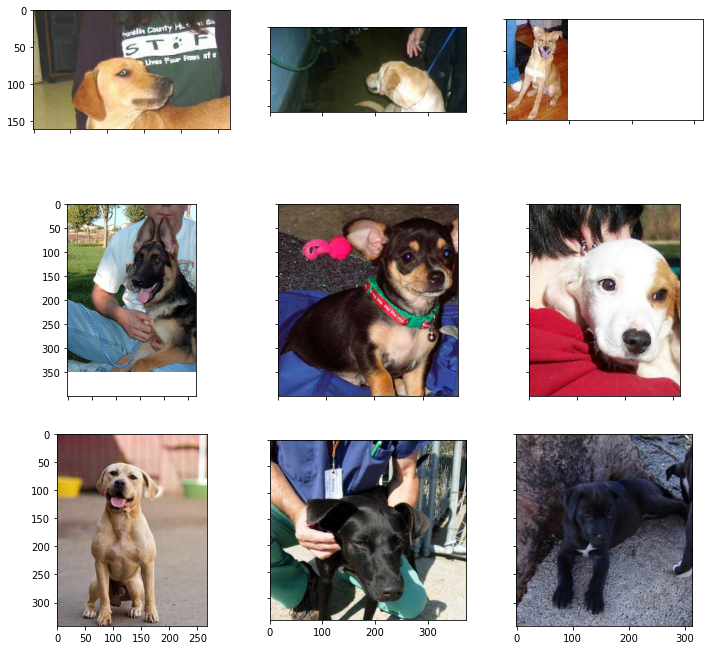

In [ ]:
dog_image_paths = 'dog vs cat/dataset/training_set/dogs'
dog_images = os.listdir(dog_image_paths)

new_style = {'grid': False}
plt.rc('axes', **new_style)
_, ax = plt.subplots(3, 3, sharex='col', sharey='row', figsize=(12, 12))

for i in range(9):
  image = dog_images[i]
  img = plt.imread( dog_image_paths + '/' + image)
  ax[i // 3, i % 3].imshow(img)

# Learning Resources for Future Reference


*   FastAI - [Data Loaders](https://docs.fast.ai/vision.data.html), [Models](https://docs.fast.ai/layers.html#ready-to-go-models)
*   SciKit-Learn - [Random Forests](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html), [Tutorial](https://www.datacamp.com/tutorial/random-forests-classifier-python)
*   Support Vector Machines (SVM) - [Tutorial](https://medium.com/analytics-vidhya/image-classification-using-machine-learning-support-vector-machine-svm-dc7a0ec92e01)



# Resnet Model using FastAI

## Image Data Loader

We use the Image Data Loader provided by FastAI to load the dataset. The Image Data Loader supports various transformations that allow us to load our images and apply any necessary transformations.

In [ ]:
from fastai.vision.all import get_image_files, ImageDataLoaders, Resize, vision_learner, resnet34, error_rate

In [ ]:
path = "dog vs cat/dataset/training_set/"

In [ ]:
files = get_image_files(path)
len(files)

8000

In [ ]:
def label_func(f): return f[0:3] == 'cat'

In [ ]:
dls = ImageDataLoaders.from_name_func(path, files, label_func, item_tfms=Resize(224))

The ImageDataLoader loads all the images from our dataset folder and resizes them so that each image is of size 224x224 pixels. It also center crops each image as shown in the image below.

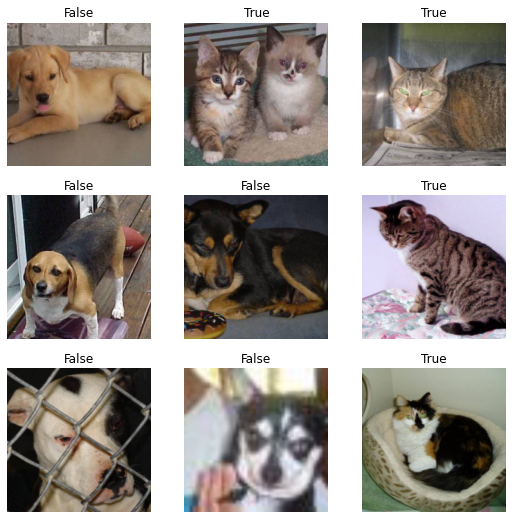

In [ ]:
dls.show_batch()

## Training the model
We will use the Vison Learner class to train an image recognition model based on the resnet34 architecture. The Vision Learner class comes with various functions that can be use to train and tune the model.

![Resnet34 Architecture](https://miro.medium.com/max/720/1*Y-u7dH4WC-dXyn9jOG4w0w.webp)

Source: [Understanding and visualizing ResNets - Pablo Ruiz](https://towardsdatascience.com/understanding-and-visualizing-resnets-442284831be8)

### Out of the Box Model
This model has been trained using the default settings and has been trained on the dataset for 1 epoch (1 run on the entire dataset)

In [ ]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fit_one_cycle(1)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,0.141221,0.042697,0.015625,00:48


### Tuned Model
We can fine tune the model by training it for more epochs and using a different learning rate. The `lr_find()` method of the Vision Learner determines the best learning rate for this model and dataset which we can use to train the model for 8 epochs.

In [ ]:
learn2 = vision_learner(dls, resnet34, metrics=error_rate)

SuggestedLRs(valley=0.0004786300996784121)

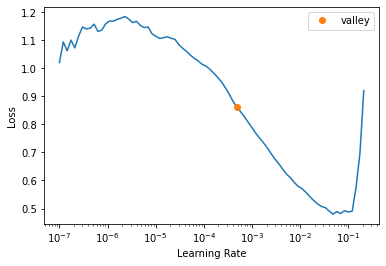

In [ ]:
learn2.lr_find()

In [ ]:
learn2.fit_one_cycle(8, lr_max=1e-3)

epoch,train_loss,valid_loss,error_rate,time
0,0.205891,0.050204,0.016250,00:43
1,0.086499,0.039705,0.013125,00:43
2,0.057673,0.031313,0.012500,00:48
3,0.039910,0.024589,0.008125,00:44
4,0.023014,0.028222,0.009375,00:43
5,0.023826,0.024817,0.008125,00:43
6,0.013110,0.025051,0.008125,00:43
7,0.016795,0.024531,0.008750,00:44


## Learning Curve

The chart below shows the loss as the as the number of batches processed increases. We see that generally, the loss decreases but as we keep training the model, the loss decreases at a slower rate

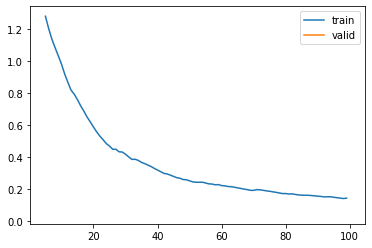

In [ ]:
learn.recorder.plot_loss()

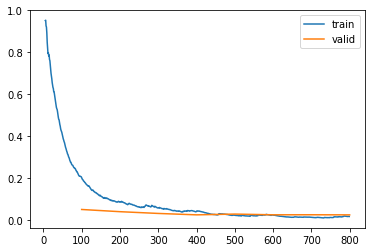

In [ ]:
learn2.recorder.plot_loss()

## Validation
We can call the `show_results()` method to have a quick look at how the model is performing on some real images. This shows the true labels with the predicted labels and highlights any wrong predictions.

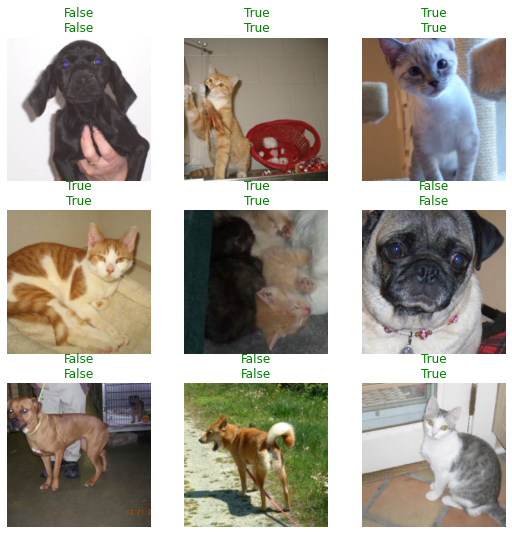

In [ ]:
# Learner 1
learn.show_results()

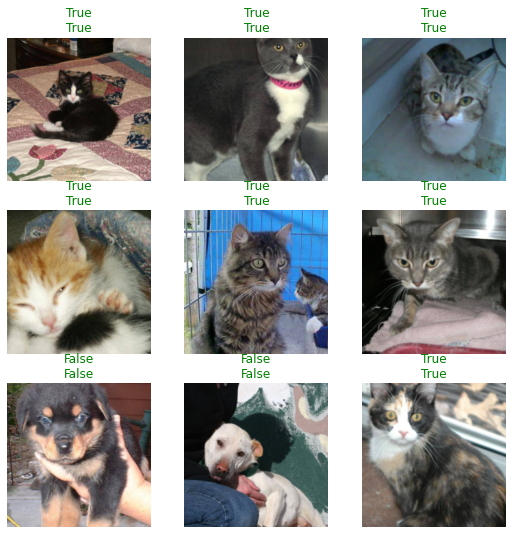

In [ ]:
learn2.show_results()

## Evaluation
We can further evaluate the two models by running them over the test dataset. This is helpful because the model has not seen the test data before. This will also help us understand if any of the models have overfit to the training dataset.

In [ ]:
from fastai.interpret import ClassificationInterpretation

In [ ]:
path = "dog vs cat/dataset/test_set/"
files = get_image_files(path)
len(files)

2000

In [ ]:
valid_dls = ImageDataLoaders.from_name_func(path, files, label_func, item_tfms=Resize(224))

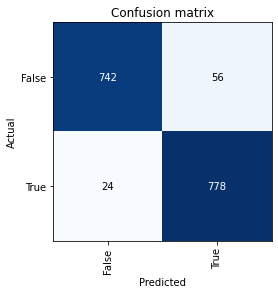

In [ ]:
# Learner 1
interep = ClassificationInterpretation.from_learner(learn, dl=valid_dls)
interep.plot_confusion_matrix()

In [ ]:
# Learner 1
interep.print_classification_report()

              precision    recall  f1-score   support

       False       0.97      0.92      0.94       798
        True       0.93      0.97      0.95       802

    accuracy                           0.95      1600
   macro avg       0.95      0.95      0.95      1600
weighted avg       0.95      0.95      0.95      1600



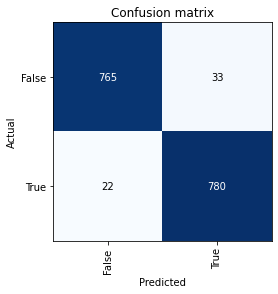

In [ ]:
# Learner 2
interep2 = ClassificationInterpretation.from_learner(learn2, dl=valid_dls)
interep2.plot_confusion_matrix()

In [ ]:
# Learner 2
interep2.print_classification_report()

              precision    recall  f1-score   support

       False       0.98      0.96      0.97       798
        True       0.96      0.98      0.97       802

    accuracy                           0.97      1600
   macro avg       0.97      0.97      0.97      1600
weighted avg       0.97      0.97      0.97      1600



## Error Analysis

We can run the tuned model over the test set to check which images were incorrectly recognized by the model. This will give us a better understanding of the model's accuracy

In [ ]:
inputs, _, predictions, targets = learn2.get_preds(dl=valid_dls, with_decoded=True, with_input=True)

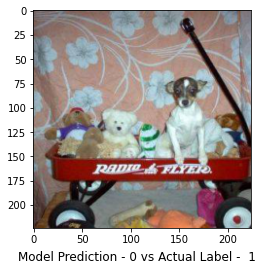

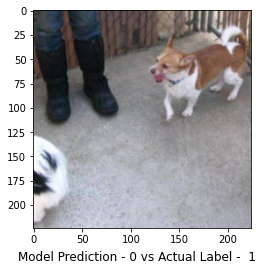

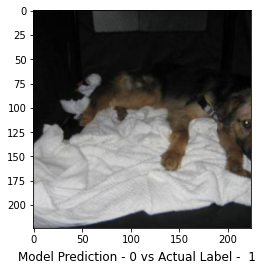

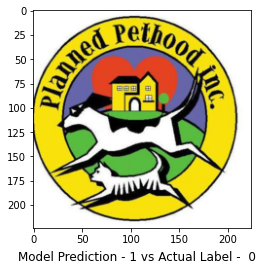

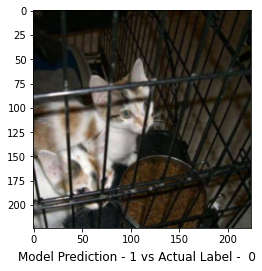

...

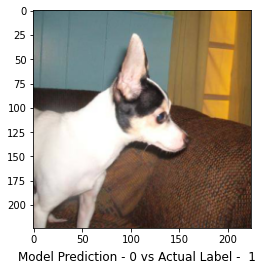

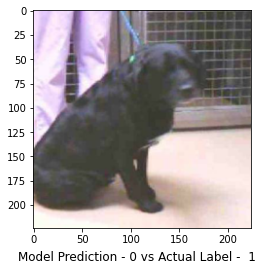

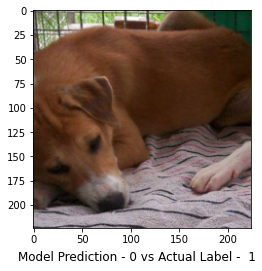

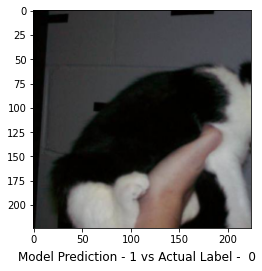

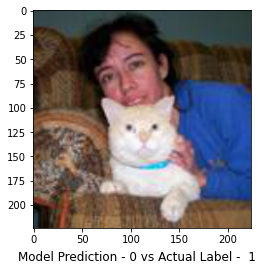

In [ ]:
for pred, target, input in zip(predictions, targets, inputs):
  if (pred.item() != target.item()):
    txt = f"Model Prediction - {pred.item()} vs Actual Label -  {target.item()}"
    plt.imshow(input.permute(1,2,0))
    plt.figtext(0.5, 0.01, txt, wrap=True, horizontalalignment='center', fontsize=12)
    plt.show()

As we can see from the images above, the incorrect predictions contain noise like other objects, humans. Moreover, some images do not contain a cat or a dog or only contain a few parts of the animal's body. Hence, we can conclude that our model is extremely accurate if it is given an image with only one subject and less noise.

# SVM Based Classifier

Things to do -


1.   Process the data (if necessary)
2.   Split training data into training and validation sets
3.   Train the model on training data
4.   Evaluate the model on test data
5.   Generate heatmaps based on the confusion matrix

Learning Material


*   [Tutorial](https://medium.com/analytics-vidhya/image-classification-using-machine-learning-support-vector-machine-svm-dc7a0ec92e01)
*   [Documentation](https://scikit-learn.org/stable/modules/classes.html#module-sklearn.svm)




In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler

from PIL import Image

from skimage import feature, color, data
from sklearn.preprocessing import LabelEncoder
import random as rn
from random import shuffle 

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn import metrics
from sklearn.svm import LinearSVC

In [ ]:
train_directory = 'dog vs cat/dataset/training_set'
test_directory = 'dog vs cat/dataset/test_set'

os.listdir('dog vs cat/dataset')

categories = ['cats', 'dogs']


In [ ]:
X_train =[] # Stores the training image hog data
label_train = [] # Stores the training image label

X_test = [] # Stores the testing image hog data
label_test = [] # Stores the testing image label

In [ ]:
def hog_data_extractor(jpeg_path):
    jpeg_data = cv2.imread(jpeg_path)
    jpeg_data=cv2.resize(jpeg_data,(150,150)) 
    hog_data = feature.hog(jpeg_data)/255.0
    return hog_data

In [ ]:
def jpeg_to_array (category_type, img_root_path,data_type):
    data_path = os.path.join(img_root_path,category_type.lower())
    print('Loading ' + data_type +' images for category type: '+category_type)
    for img in os.listdir(data_path):
        img_path = os.path.join(data_path,img)
        if img_path.endswith('.jpg'):
            if(data_type == 'Training'):
                X_train.append(hog_data_extractor(img_path))
                label_train.append(str(category_type))
            if(data_type =='Testing'):
                X_test.append(hog_data_extractor(img_path))
                label_test.append(np.array(str(category_type)))

In [ ]:
[jpeg_to_array(scene,train_directory,'Training')for scene in categories]
len(X_train)
[jpeg_to_array(scene,test_directory,'Testing')for scene in categories]
len(X_test)

Loading Training images for category type: cats
Loading Training images for category type: dogs
Loading Testing images for category type: cats
Loading Testing images for category type: dogs


2000

In [ ]:
le = LabelEncoder()
y_train = le.fit_transform(label_train)
y_test = le.fit_transform(label_test)

In [ ]:
lsvc = LinearSVC(random_state=0,tol=1e-5)
lsvc.fit(X_train,y_train)
print('Coef',lsvc.coef_)
print('Intercept',lsvc.intercept_)

Coef [[-0.10575185  0.18165796  0.19469889 ...  0.19529037  0.24509294
   0.18492197]]
Intercept [-0.21083413]


In [ ]:
# filter all the warnings
import warnings
warnings.filterwarnings('ignore')

# 10-fold cross validation
lsvc_score = lsvc.score(X_test,y_test)
print('Score', lsvc_score)
kfold = KFold(n_splits=10, random_state=None)
cv_results = cross_val_score(lsvc , X_train, y_train, cv=kfold, scoring="accuracy")
print(cv_results)

Score 0.731
[0.24375 0.2625  0.2775  0.27125 0.23875 0.25125 0.27    0.2525  0.25875
 0.27   ]


In [ ]:
print(cv_results.mean(), cv_results.std())

0.259625 0.012196951463378063


In [ ]:
def category_predict(img_path):
    image = cv2.imread(img_path)
    ip_image = Image.open(img_path)
    image = cv2.resize(image,(150,150))
    prd_image_data = hog_data_extractor(img_path)
    category_predicted = lsvc.predict(prd_image_data.reshape(1, -1))[0]
    fig, ax = plt.subplots(1, 2, figsize=(12, 6),
                       subplot_kw=dict(xticks=[], yticks=[]))
    ax[0].imshow(ip_image)
    ax[0].set_title('Input image')

    ax[1].imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    ax[1].set_title('Category predicted :'+ categories[category_predicted]);

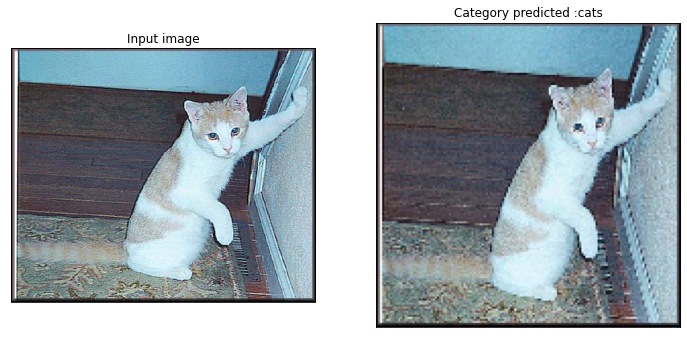

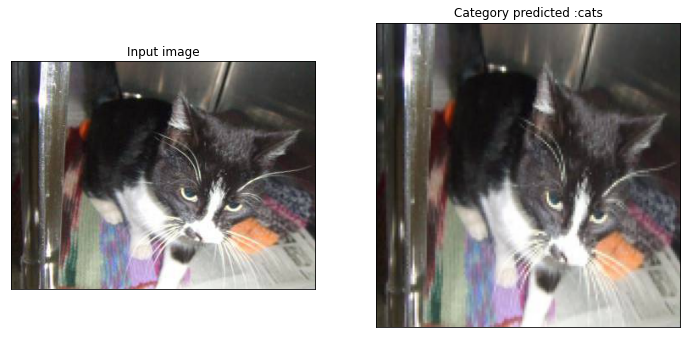

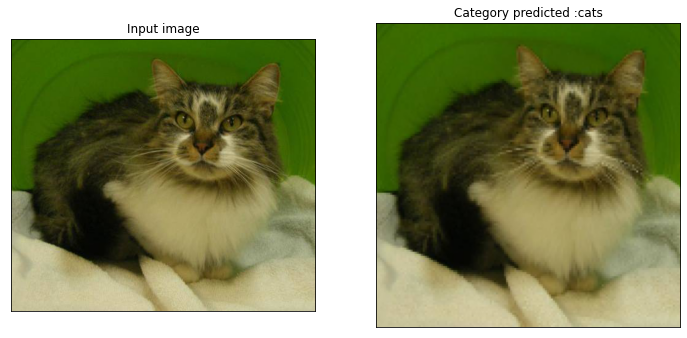

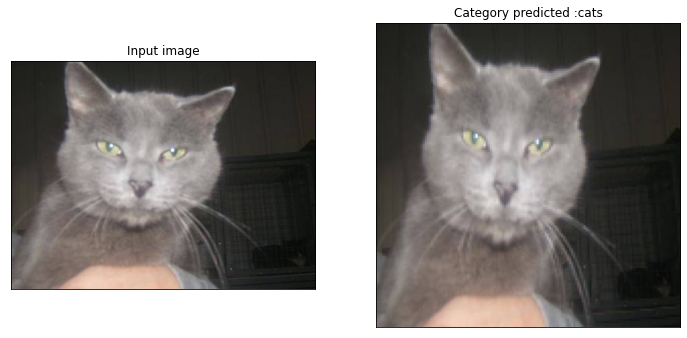

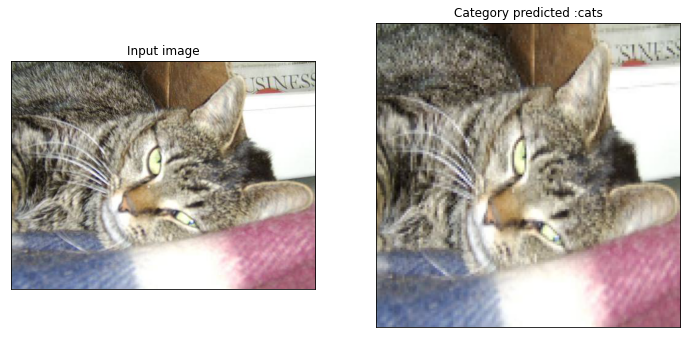

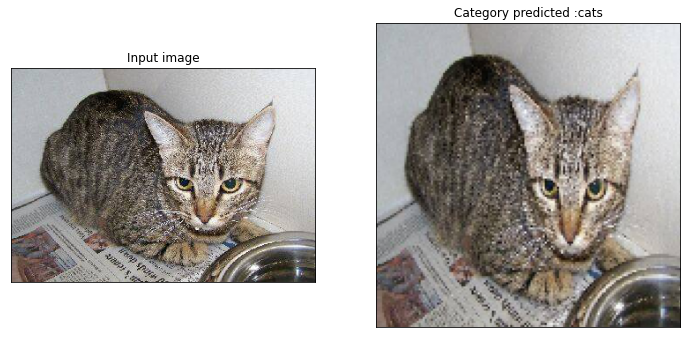

In [ ]:
ip_img_folder_cats = 'dog vs cat/dataset/test_set/cats'
ip_img_files_cats = ['cat.4001.jpg','cat.4232.jpg','cat.4333.jpg','cat.4672.jpg','cat.4904.jpg', 'cat.5000.jpg']
category_predicted_cats = [category_predict(os.path.join(ip_img_folder_cats,img_file))for img_file in ip_img_files_cats]

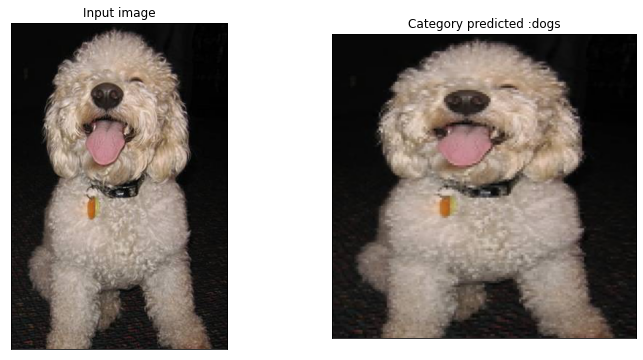

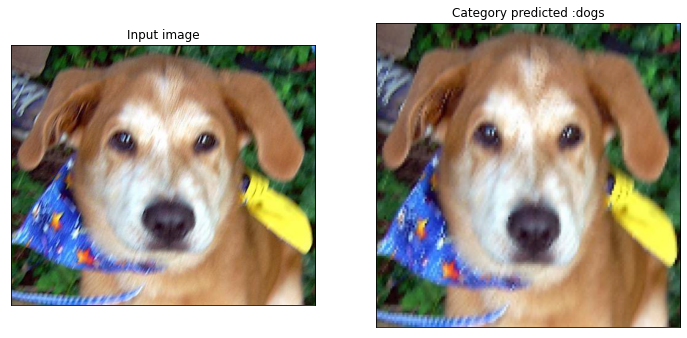

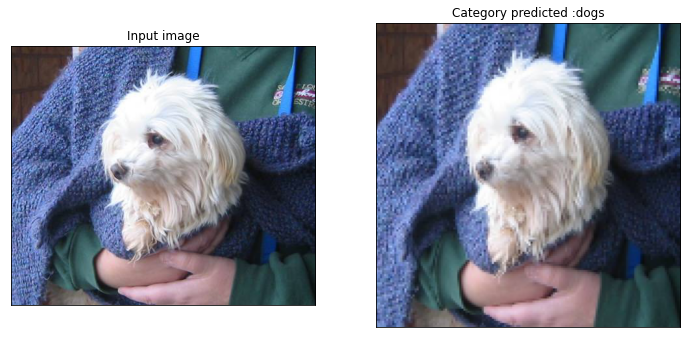

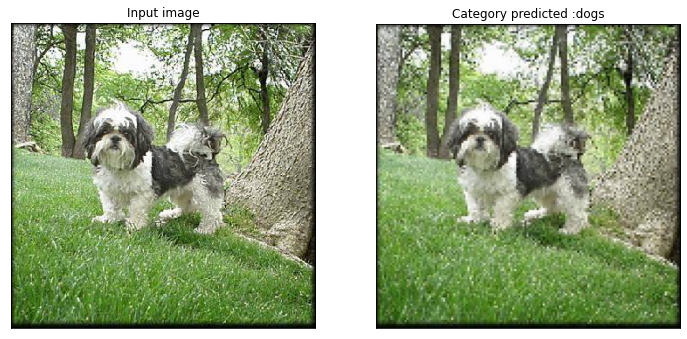

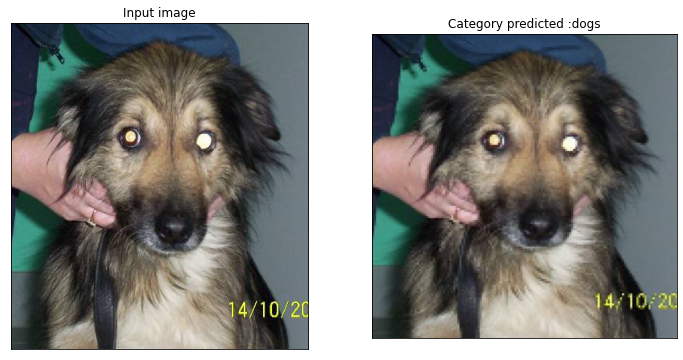

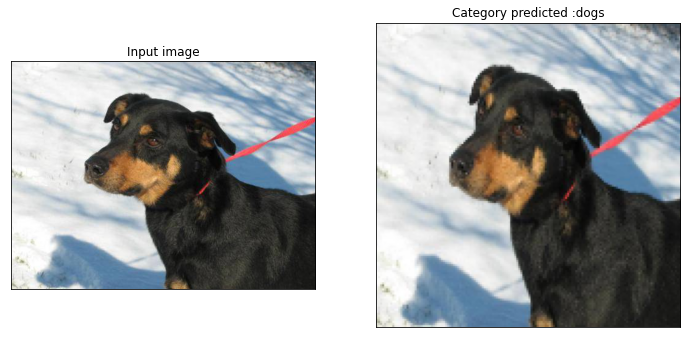

In [ ]:
ip_img_folder_dogs = 'dog vs cat/dataset/test_set/dogs'
ip_img_files_dogs = ['dog.4003.jpg','dog.4231.jpg','dog.4333.jpg','dog.4672.jpg','dog.4902.jpg', 'dog.5000.jpg']
category_predicted_dogs = [category_predict(os.path.join(ip_img_folder_dogs,img_file))for img_file in ip_img_files_dogs]

In [ ]:
prediction = lsvc.predict(X_test)

accuracy = lsvc.score(X_test, y_test)


In [ ]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)

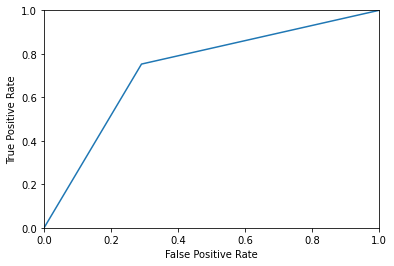

0.7310000000000001


In [ ]:
def plot_roc_curve(fpr,tpr): 
  plt.plot(fpr,tpr) 
  plt.axis([0,1,0,1]) 
  plt.xlabel('False Positive Rate') 
  plt.ylabel('True Positive Rate') 
  plt.show()
  auc_roc = metrics.auc(fpr, tpr)
  print(auc_roc)
plot_roc_curve (fpr,tpr)

In [ ]:
print(classification_report(y_test, prediction))

              precision    recall  f1-score   support

           0       0.74      0.71      0.72      1000
           1       0.72      0.75      0.74      1000

    accuracy                           0.73      2000
   macro avg       0.73      0.73      0.73      2000
weighted avg       0.73      0.73      0.73      2000



# Random Forest Classifier
Things to do -


1.   Process the data (if necessary)
2.   Split training data into training and validation sets
3.   Train the model on training data
4.   Evaluate the model on test data
5.   Generate heatmaps based on the confusion matrix

Learning Material


*   [Tutorial](https://www.analyticsvidhya.com/blog/2022/01/image-classification-using-machine-learning/)
*   [Documentation](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html)



In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model=RandomForestClassifier(n_estimators=200, min_samples_split=15, min_samples_leaf=10)
model.fit(X_train,y_train)


RandomForestClassifier(min_samples_leaf=10, min_samples_split=15,
                       n_estimators=200)

In [ ]:
y_pred=model.predict(X_test)

In [ ]:
accuracy_score(y_test, y_pred)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.70      0.73      0.71      1000
           1       0.72      0.69      0.70      1000

    accuracy                           0.71      2000
   macro avg       0.71      0.71      0.71      2000
weighted avg       0.71      0.71      0.71      2000



In [ ]:
confusion_matrix(y_test, y_pred)

array([[730, 270],
       [314, 686]])

In [ ]:
prediction = model.predict(X_test)

accuracy = model.score(X_test, y_test)

print("Accuracy: ", accuracy)

Accuracy:  0.708


In [ ]:
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)

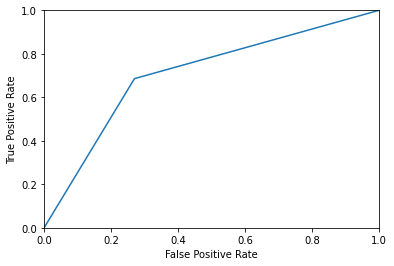

0.708


In [ ]:
plot_roc_curve (fpr,tpr)

In [ ]:
print(metrics.recall_score(y_test, y_pred))
print(metrics.precision_score(y_test, y_pred))
print(metrics.f1_score(y_test, y_pred))

0.686
0.7175732217573222
0.7014314928425358


# KNN - K Nearest Neighbors

Things to do -


1.   Process the data (if necessary)
2.   Split training data into training and validation sets
3.   Train the model on training data
4.   Evaluate the model on test data
5.   Generate heatmaps based on the confusion matrix

Learning Material


*   [Tutorial](https://www.analyticsvidhya.com/blog/2022/01/image-classification-using-machine-learning/)
*   [Documentation](https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html)

In [ ]:
!pip install Pillow==9.3.0
!pip install rembg
!pip install -U scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pillow==9.3.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import PIL
print(PIL.__version__)

9.3.0


In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:

!mkdir ~/.kaggle
!pip install -q kaggle
kaggle_username =''
kaggle_key = ''
!echo '{"username":"koakke1509","key":"5c36949fd3637e64df18e5bfc249fac9"}' > ~/.kaggle/kaggle.json
!kaggle datasets download -d chetankv/dogs-cats-images

mkdir: cannot create directory ‘/root/.kaggle’: File exists
dogs-cats-images.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
!mkdir data
!unzip dogs-cats-images.zip -d data

mkdir: cannot create directory ‘data’: File exists
Archive:  dogs-cats-images.zip
replace data/dataset/test_set/cats/cat.4001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
from PIL import Image

In [ ]:
import os
path_dogs = os.listdir('/content/data/dog vs cat/dataset/training_set/dogs')
path_cats = os.listdir('/content/data/dog vs cat/dataset/training_set/cats')

In [ ]:
from rembg import remove
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pandas as pd 

In [ ]:
path = 'dog.1192.jpg'
img = cv2.imread('/content/data/dog vs cat/dataset/training_set/dogs/'+path)
print(img)
tranform = remove(img)
# plt.imshow(tranform)
# tranform = np.asarray(tranform)
# imgray = cv2.cvtColor(tranform, cv2.COLOR_BGR2GRAY)
# img_reshape = cv2.resize(imgray,(50,50))
# img_flat = img_reshape.flatten().tolist()

[[[ 64  64  58]
  [ 64  64  58]
  [ 69  69  63]
  ...
  [ 79  81  89]
  [ 79  81  89]
  [ 80  82  90]]

 [[ 60  60  54]
  [ 61  61  55]
  [ 67  67  61]
  ...
  [ 82  84  92]
  [ 81  83  91]
  [ 81  83  91]]

 [[ 62  59  54]
  [ 63  60  55]
  [ 68  65  60]
  ...
  [ 82  84  92]
  [ 82  84  92]
  [ 81  83  91]]

 ...

 [[ 94 106 110]
  [ 92 104 108]
  [ 90 102 106]
  ...
  [ 73  61  59]
  [ 74  62  60]
  [ 76  64  62]]

 [[ 94 106 110]
  [ 93 105 109]
  [ 92 104 108]
  ...
  [ 74  62  60]
  [ 76  64  62]
  [ 77  65  63]]

 [[ 93 105 109]
  [ 93 105 109]
  [ 92 104 108]
  ...
  [ 75  63  61]
  [ 77  65  63]
  [ 78  66  64]]]


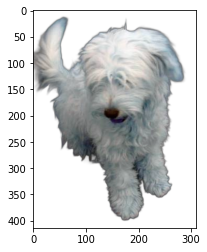

In [ ]:
plt.imshow(tranform)

In [ ]:
result_dog = []
i=1
print(path_dogs)
for path in path_dogs:
  if i<201:
      print(i,'/',len(path_dogs))
      img = cv2.imread('/content/dog vs cat/dataset/training_set/dogs/'+path)
      tranform = remove(img)
      tranform = np.asarray(tranform)
      imgray = cv2.cvtColor(tranform, cv2.COLOR_BGR2GRAY)
      img_reshape = cv2.resize(imgray,(50,50))
      img_flat = img_reshape.flatten().tolist()
      result_dog.append(img_flat)
      i=i+1

result_cat = []
print(path_cats)
i=1
for path in path_cats:
  if i<201:
      print(i,'/',len(path_cats))
      img = cv2.imread('/content/dog vs cat/dataset/training_set/cats/'+path)
      tranform = remove(img)
      tranform = np.asarray(tranform)
      imgray = cv2.cvtColor(tranform, cv2.COLOR_BGR2GRAY)
      img_reshape = cv2.resize(imgray,(50,50))
      img_flat = img_reshape.flatten().tolist()
      result_cat.append(img_flat)
      i=i+1


['dog.2308.jpg', 'dog.657.jpg', 'dog.2897.jpg', 'dog.1096.jpg', 'dog.451.jpg', 'dog.1781.jpg', 'dog.1432.jpg', 'dog.2436.jpg', 'dog.773.jpg', 'dog.1698.jpg', 'dog.1857.jpg', 'dog.1329.jpg', 'dog.3343.jpg', 'dog.1095.jpg', 'dog.1229.jpg', 'dog.2521.jpg', 'dog.3253.jpg', 'dog.3490.jpg', 'dog.1101.jpg', 'dog.3788.jpg', 'dog.3925.jpg', 'dog.599.jpg', 'dog.3633.jpg', 'dog.1852.jpg', 'dog.1104.jpg', 'dog.2578.jpg', 'dog.3810.jpg', 'dog.1191.jpg', 'dog.2169.jpg', 'dog.2934.jpg', 'dog.3082.jpg', 'dog.2342.jpg', 'dog.613.jpg', 'dog.3946.jpg', 'dog.3411.jpg', 'dog.1937.jpg', 'dog.2269.jpg', 'dog.3305.jpg', 'dog.1336.jpg', 'dog.2446.jpg', 'dog.3133.jpg', 'dog.2170.jpg', 'dog.3993.jpg', 'dog.203.jpg', 'dog.1044.jpg', 'dog.3263.jpg', 'dog.2582.jpg', 'dog.2995.jpg', 'dog.1729.jpg', 'dog.2849.jpg', 'dog.63.jpg', 'dog.2458.jpg', 'dog.1241.jpg', 'dog.2772.jpg', 'dog.1976.jpg', 'dog.2332.jpg', 'dog.3738.jpg', 'dog.3397.jpg', 'dog.2274.jpg', 'dog.2688.jpg', 'dog.2698.jpg', 'dog.3367.jpg', 'dog.950.jpg', 

In [ ]:
result_dog1=result_dog+result_cat
np.shape(result_cat)
data = np.array(result_dog1)
label = np.ones(np.shape(result_dog)[0]).tolist() + np.zeros(np.shape(result_cat)[0]).tolist()
label = np.array([label]).T
print(np.shape(data))
print(np.shape(label))
da = np.hstack((label,data))

(400, 2500)
(400, 1)


[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 5. 4. 3.]
 [0. 0. 0. ... 0. 0. 0.]]
(400, 5)
accuracy:  0.6
recall:  0.6341463414634146
precision:  0.6046511627906976
f1 score:  0.6190476190476191


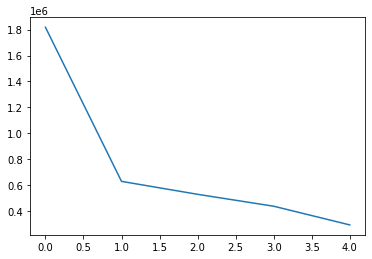

In [ ]:
import sklearn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
np.random.seed(41)
pca = PCA(n_components=5)
KNN = KNeighborsClassifier()
Y=da[:,0]
X=da[:,1:]
print(X)
pca = pca.fit(X)
pca.explained_variance_
plt.plot(pca.explained_variance_)
X_use = pca.fit_transform(X)
print(np.shape(X_use))
Xtrain,Xtest,Ytrain,Ytest = train_test_split(X_use,Y,test_size=0.2)
para = {'n_neighbors':[5,10,15]}
Grid = GridSearchCV(KNN, para)
model = Grid.fit(Xtrain,Ytrain)
ypred = model.predict(Xtest)
accuracy_score(Ytest, ypred)
print('accuracy: ',accuracy_score(Ytest, ypred))
print('recall: ', sklearn.metrics.recall_score(Ytest,ypred))
print('precision: ',sklearn.metrics.precision_score(Ytest,ypred))
print('f1 score: ', sklearn.metrics.f1_score(Ytest,ypred))

# Comparison of All Models

Based on the results obtained above, we can draw a comparison of the models on the following metrics - F1 score, precision and recall.

| Model Name | Resnet34 (untuned) | Resnet34 (tuned) | SVM | Random Forest | KNN |
|------------|--------------------|------------------|-----|---------------|-----|
| Precision  | 0.95               | 0.97             | 0.73    | 0.71          |0.60    |
| Recall     | 0.95               | 0.97             | 0.73    | 0.71          |0.63    |
| F1-Score   | 0.95               | 0.97             | 0.73    | 0.71          |0.62    |

The table above shows a comparison of all the models for the different metrics. We can see that out of the box, the Resnet34 Model achieves the best results which can be further improved with the help of hyperparameter tuning.